In [1]:
import os
import random
import numpy as np
from tqdm import tqdm
from PIL import Image 
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, ConcatDataset
from torch.utils.data import Dataset

# **Deep Convolutional GAN (DCGAN)**

In [10]:
# Hyperparameters
d_lr = 0.0001
g_lr = 0.0001
batch_size = 64
image_size = 64
nz = 100  # Latent vector size
num_epochs = 100
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

In [3]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # Resize images
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize for RGB images
])

# Load the Flowers102 dataset
train_dataset = datasets.Flowers102(root="./data", split="train", transform=transform, download=True)
test_dataset = datasets.Flowers102(root="./data", split="test", transform=transform, download=True)

# Combine train and test datasets
combined_dataset = ConcatDataset([train_dataset, test_dataset])
dataloader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

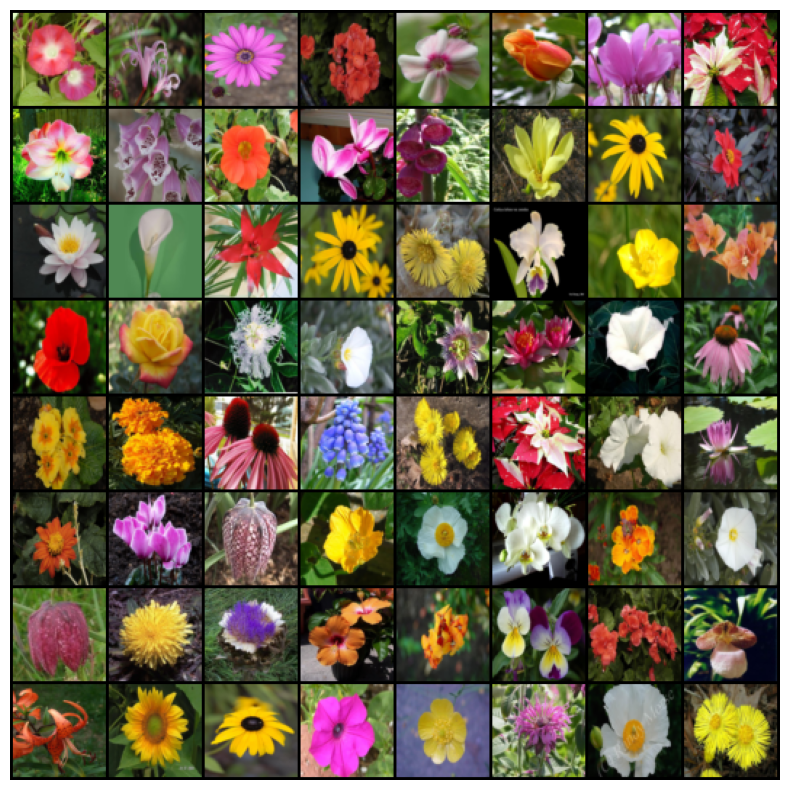

In [4]:
# Visualizing real samples
real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.imshow(vutils.make_grid(real_batch[0][:64], normalize=True).permute(1, 2, 0).cpu().numpy())
plt.show()

In [60]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: 3x64x64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),        # 32x32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),      # 16x16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),      # 8x8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),      # 4x4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),        # 1x1
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.main(x).view(-1, 1)  # Flatten to [batch_size, 1]

In [6]:
# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Loss and Optimizers
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=g_lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=d_lr, betas=(0.5, 0.999))

#Log loss
g_loss_log = []
d_loss_log = []

Epoch 10/100: 100%|███████████████████████████████████████| 113/113 [00:33<00:00,  3.35it/s, D_Loss=0.319, G_Loss=5.33]

Epoch [10/100] Loss D: 0.3187, Loss G: 5.3312


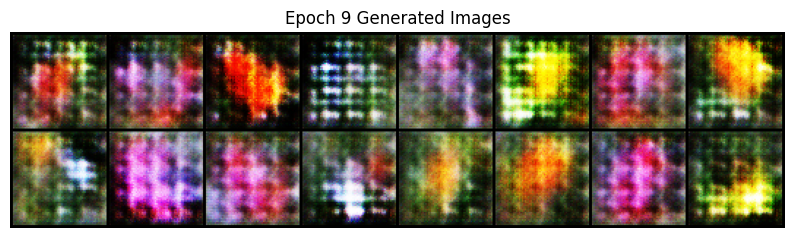

Epoch 20/100: 100%|███████████████████████████████████████| 113/113 [00:40<00:00,  2.81it/s, D_Loss=0.484, G_Loss=4.29]

Epoch [20/100] Loss D: 0.4835, Loss G: 4.2892


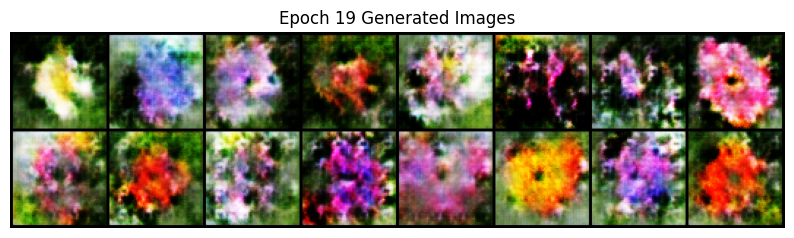

Epoch 30/100: 100%|███████████████████████████████████████| 113/113 [00:36<00:00,  3.11it/s, D_Loss=0.402, G_Loss=4.22]

Epoch [30/100] Loss D: 0.4018, Loss G: 4.2220


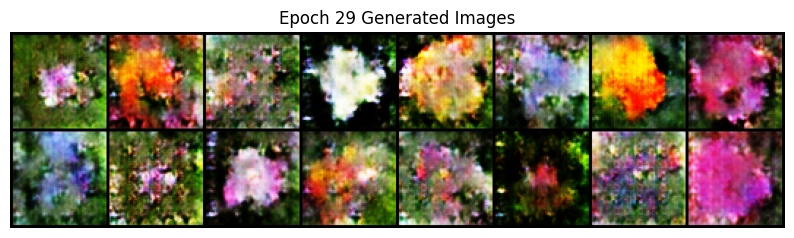

Epoch 40/100: 100%|███████████████████████████████████████| 113/113 [00:34<00:00,  3.24it/s, D_Loss=0.203, G_Loss=4.22]

Epoch [40/100] Loss D: 0.2028, Loss G: 4.2180


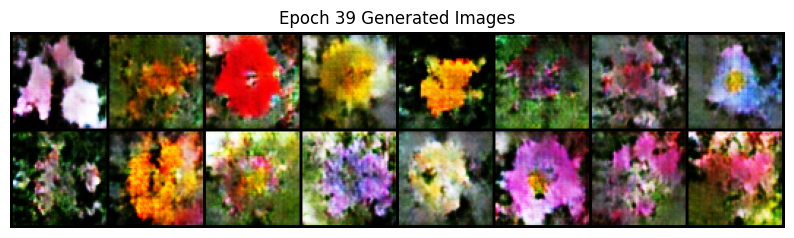

Epoch 50/100: 100%|███████████████████████████████████████| 113/113 [00:34<00:00,  3.23it/s, D_Loss=0.313, G_Loss=4.24]

Epoch [50/100] Loss D: 0.3134, Loss G: 4.2392


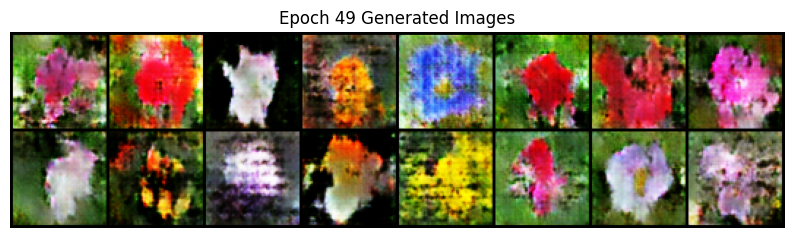

Epoch 60/100: 100%|████████████████████████████████████████| 113/113 [00:35<00:00,  3.19it/s, D_Loss=0.49, G_Loss=3.82]

Epoch [60/100] Loss D: 0.4898, Loss G: 3.8215


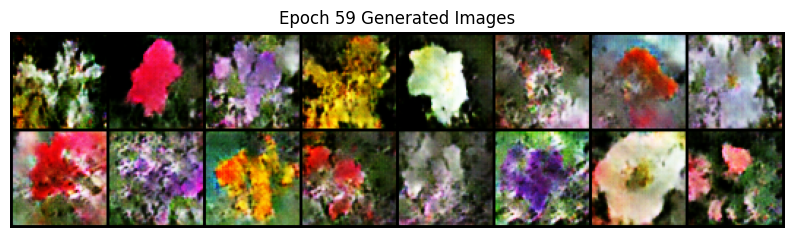

Epoch 70/100: 100%|████████████████████████████████████████| 113/113 [00:34<00:00,  3.28it/s, D_Loss=0.16, G_Loss=4.28]

Epoch [70/100] Loss D: 0.1604, Loss G: 4.2765


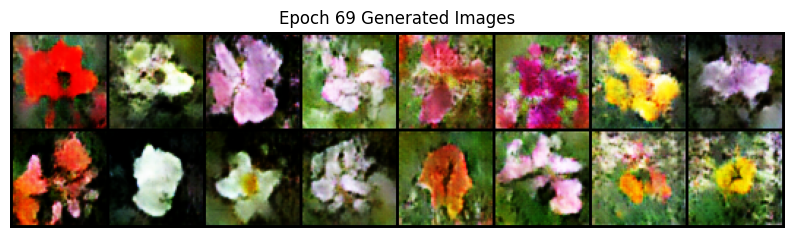

Epoch 80/100: 100%|████████████████████████████████████████| 113/113 [00:34<00:00,  3.31it/s, D_Loss=0.19, G_Loss=4.01]

Epoch [80/100] Loss D: 0.1899, Loss G: 4.0101


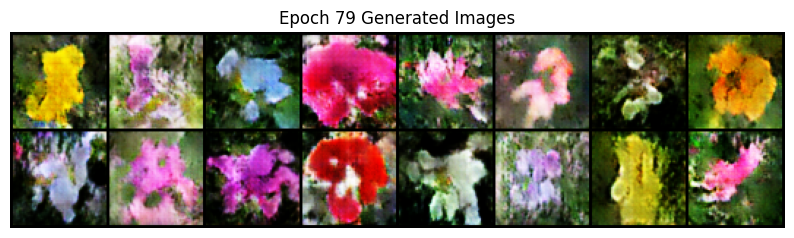

Epoch 90/100: 100%|████████████████████████████████████████| 113/113 [00:34<00:00,  3.24it/s, D_Loss=0.133, G_Loss=4.3]

Epoch [90/100] Loss D: 0.1333, Loss G: 4.3027


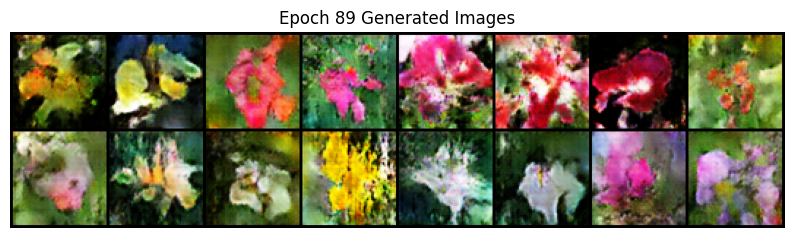

Epoch 100/100: 100%|█████████████████████████████████████| 113/113 [00:33<00:00,  3.37it/s, D_Loss=0.0914, G_Loss=4.46]

Epoch [100/100] Loss D: 0.0914, Loss G: 4.4557


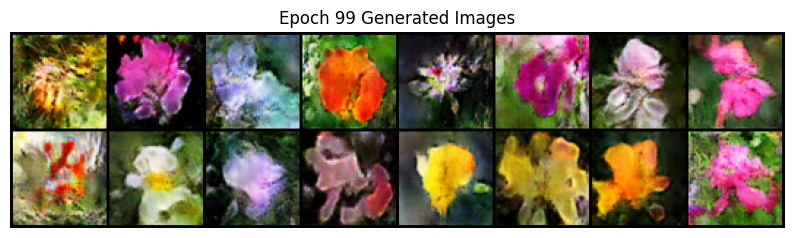

In [7]:
 # Training Loop
for epoch in range(num_epochs):
    g_losses = []
    d_losses = []
    
    with tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # Labels
            real_labels = torch.ones(current_batch_size, 1).to(device)
            fake_labels = torch.zeros(current_batch_size, 1).to(device)

            # Train Discriminator
            optimizer_D.zero_grad()
            real_outputs = discriminator(real_images)
            real_loss = criterion(real_outputs, real_labels)

            z = torch.randn(current_batch_size, nz, 1, 1).to(device)
            fake_images = generator(z)
            fake_outputs = discriminator(fake_images.detach())
            fake_loss = criterion(fake_outputs, fake_labels)

            d_loss = real_loss + fake_loss
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = criterion(fake_outputs, real_labels)
            g_loss.backward()
            optimizer_G.step()

            g_loss_log.append(g_loss.item())
            d_loss_log.append(d_loss.item())
            
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())
            
            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))
            
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")
        
        # Save samples
        with torch.no_grad():
            z = torch.randn(16, nz, 1, 1).to(device)
            sample_images = generator(z)
            grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)
            plt.figure(figsize=(10, 10))
            plt.axis("off")
            plt.title(f"Epoch {epoch} Generated Images")
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.show()

# **Mode Collapse Example**

In [42]:
nz = 100
num_epochs = 10

In [43]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: 3x64x64
            nn.Conv2d(1, 64, 4, 2, 1, bias=False),        # 32x32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),      # 16x16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),      # 8x8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),      # 4x4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1024, 4, 2, 1, bias=False),      # 2x2
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(1024, 1, 2, 1, 0, bias=False),        # 1x1
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.main(x).view(-1, 1)  # Flatten to [batch_size, 1]

In [44]:
# Transformations for FMNIST
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load train and test datasets
train_dataset = datasets.MNIST(root="./data", train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root="./data", train=False, transform=transform, download=True)

# Combine train and test datasets
combined_dataset = ConcatDataset([train_dataset, test_dataset])
dataloader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

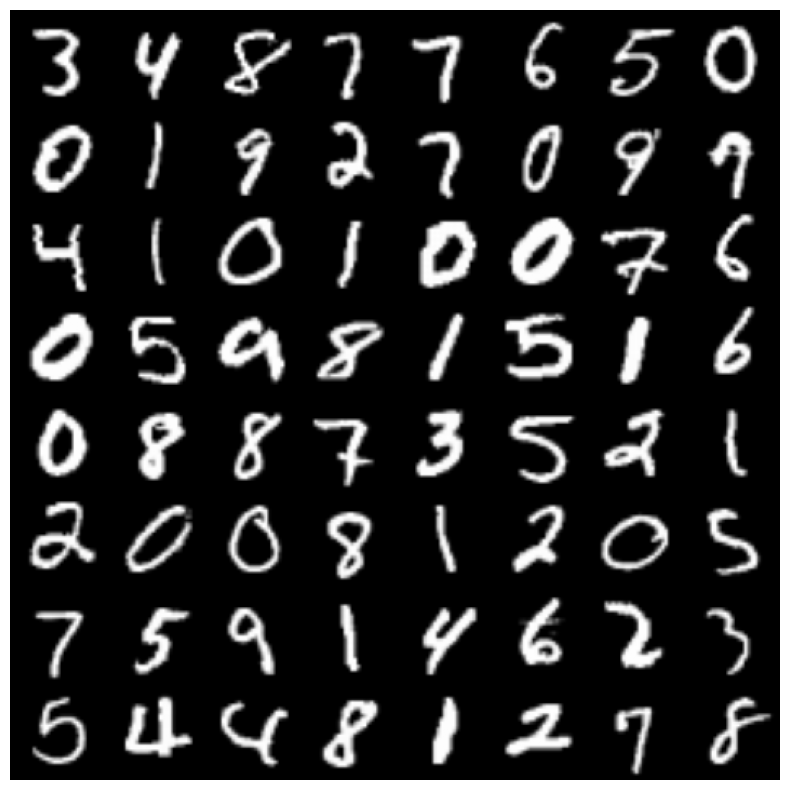

In [45]:
# Visualizing real samples
real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.imshow(vutils.make_grid(real_batch[0][:64], normalize=True).permute(1, 2, 0).cpu().numpy())
plt.show()

In [46]:
# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Loss and Optimizers
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=g_lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=d_lr, betas=(0.5, 0.999))

#Log loss
g_loss_log = []
d_loss_log = []

Epoch 1/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.26it/s, D_Loss=0.375, G_Loss=5.82]


Epoch [1/10] Loss D: 0.3748, Loss G: 5.8240


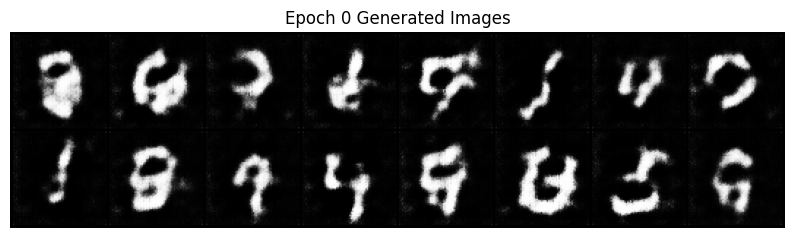

Epoch 2/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.24it/s, D_Loss=0.365, G_Loss=3.73]


Epoch [2/10] Loss D: 0.3653, Loss G: 3.7254


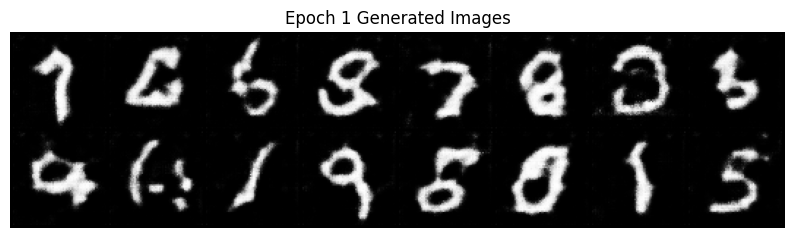

Epoch 3/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.25it/s, D_Loss=0.373, G_Loss=3.78]


Epoch [3/10] Loss D: 0.3725, Loss G: 3.7769


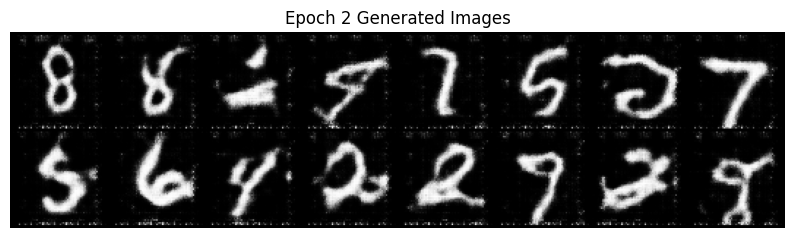

Epoch 4/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.27it/s, D_Loss=0.283, G_Loss=4.22]


Epoch [4/10] Loss D: 0.2831, Loss G: 4.2198


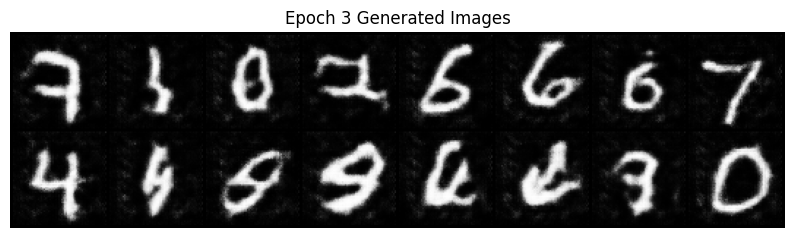

Epoch 5/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.26it/s, D_Loss=0.277, G_Loss=4.25]


Epoch [5/10] Loss D: 0.2766, Loss G: 4.2492


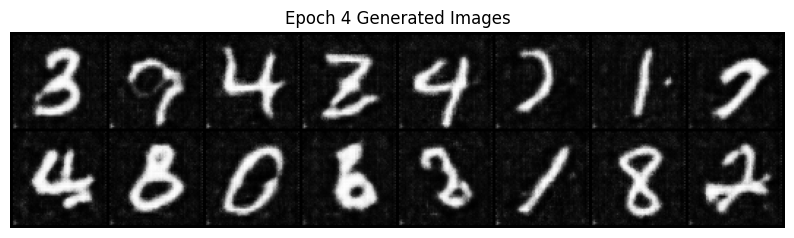

Epoch 6/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.22it/s, D_Loss=0.272, G_Loss=4.92]


Epoch [6/10] Loss D: 0.2717, Loss G: 4.9181


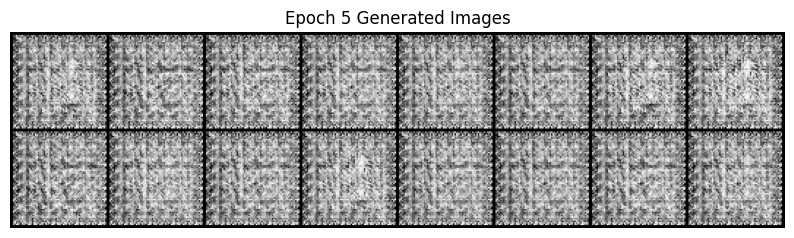

Epoch 7/10: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.26it/s, D_Loss=0.0221, G_Loss=8.11]


Epoch [7/10] Loss D: 0.0221, Loss G: 8.1148


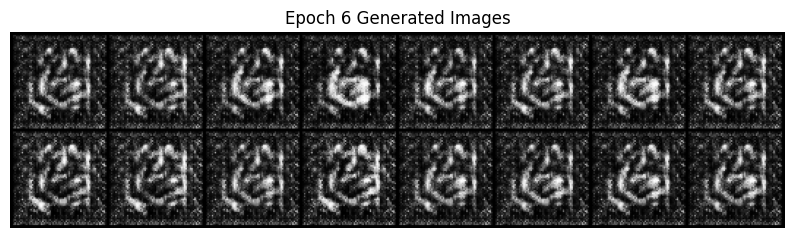

Epoch 8/10: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.25it/s, D_Loss=0.0436, G_Loss=7.1]


Epoch [8/10] Loss D: 0.0436, Loss G: 7.1016


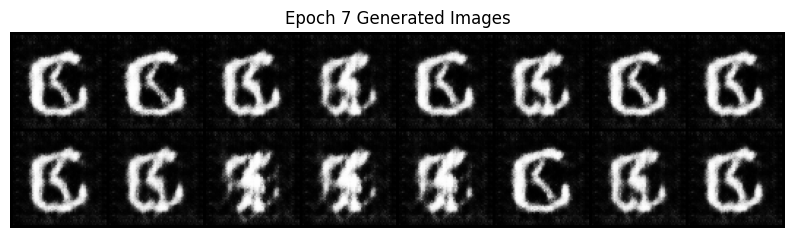

Epoch 9/10: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.28it/s, D_Loss=0.159, G_Loss=5.8]


Epoch [9/10] Loss D: 0.1594, Loss G: 5.8005


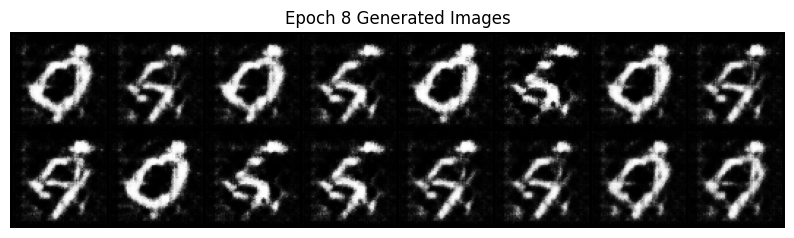

Epoch 10/10: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1094/1094 [01:11<00:00, 15.24it/s, D_Loss=0.128, G_Loss=5.89]


Epoch [10/10] Loss D: 0.1279, Loss G: 5.8914


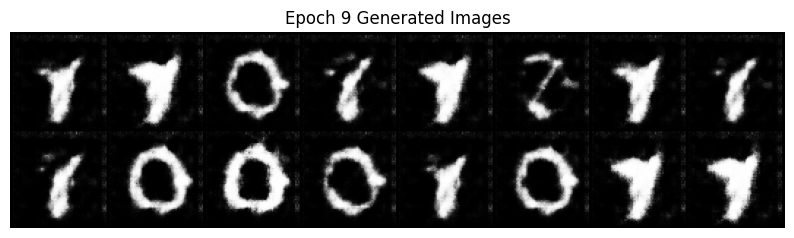

In [47]:
 # Training Loop
for epoch in range(num_epochs):
    g_losses = []
    d_losses = []
    
    with tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # Labels
            real_labels = torch.ones(current_batch_size, 1).to(device)
            fake_labels = torch.zeros(current_batch_size, 1).to(device)

            # Train Discriminator
            optimizer_D.zero_grad()
            real_outputs = discriminator(real_images)
            real_loss = criterion(real_outputs, real_labels)

            z = torch.randn(current_batch_size, nz, 1, 1).to(device)
            fake_images = generator(z)
            fake_outputs = discriminator(fake_images.detach())
            fake_loss = criterion(fake_outputs, fake_labels)

            d_loss = real_loss + fake_loss
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = criterion(fake_outputs, real_labels)
            g_loss.backward()
            optimizer_G.step()

            g_loss_log.append(g_loss.item())
            d_loss_log.append(d_loss.item())
            
            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())
            
            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))
            
    if (epoch + 1) % 1 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")
        
        # Save samples
        with torch.no_grad():
            z = torch.randn(16, nz, 1, 1).to(device)
            sample_images = generator(z)
            grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)
            plt.figure(figsize=(10, 10))
            plt.axis("off")
            plt.title(f"Epoch {epoch} Generated Images")
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.show()

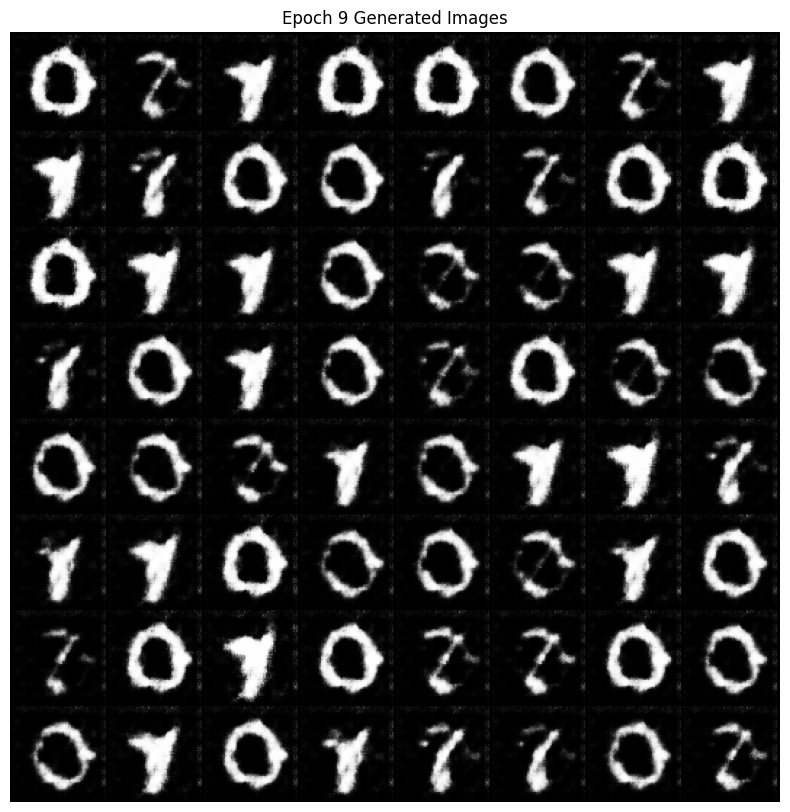

In [48]:
with torch.no_grad():
    z = torch.randn(64, nz, 1, 1).to(device)
    sample_images = generator(z)
    grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)
    plt.figure(figsize=(10, 10))
    plt.axis("off")
    plt.title(f"Epoch {epoch} Generated Images")
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.show()

# **Wasserstein GAN (WGAN)**

In [49]:
weight_clip = 0.01
n_critic = 5
num_epochs = 10
batch_size = 128

In [50]:
# Data loading
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
dataset = datasets.CelebA(root="./data", split="train", transform=transform, download=True)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Files already downloaded and verified


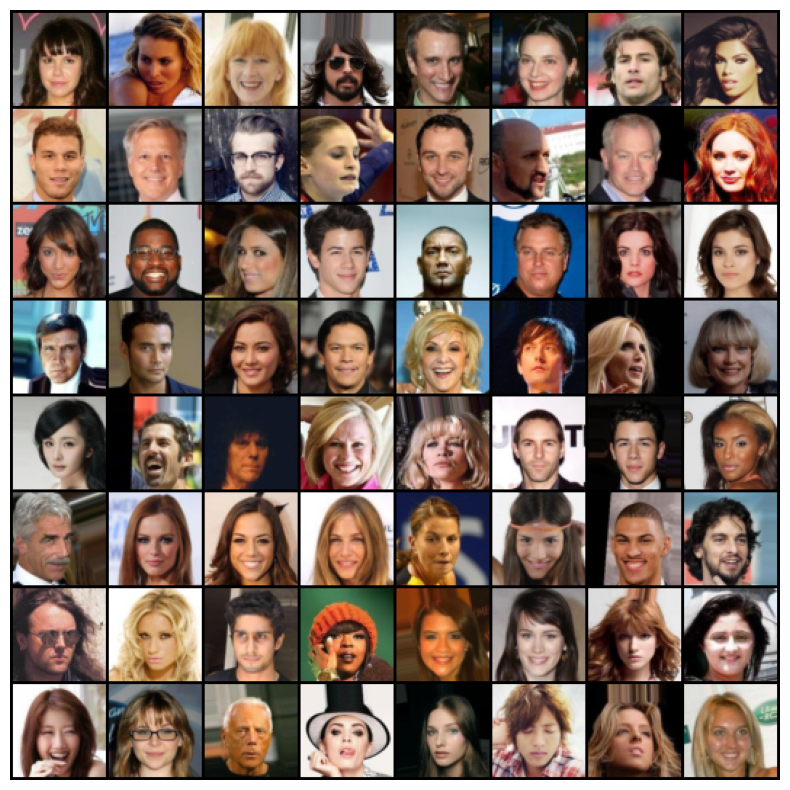

In [51]:
# Visualizing real samples
real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.imshow(vutils.make_grid(real_batch[0][:64], normalize=True).permute(1, 2, 0).cpu().numpy())
plt.show()

In [52]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: 3x64x64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),        # 32x32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),      # 16x16
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),      # 8x8
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),      # 4x4
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),        # 1x1
        )
    
    def forward(self, x):
        return self.main(x).view(-1, 1)  # Flatten to [batch_size, 1]

In [55]:
# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Use RMSprop instead of Adam for WGAN
optimizer_G = optim.RMSprop(generator.parameters(), lr=g_lr)
optimizer_D = optim.RMSprop(discriminator.parameters(), lr=d_lr)

#Log loss
g_loss_log = []
d_loss_log = []

Epoch 10/10: 100%|████████████████████████████████████| 1272/1272 [09:25<00:00,  2.25it/s, D_Loss=-0.365, G_Loss=0.185]


Epoch [10/10] Loss D: -0.3649, Loss G: 0.1850


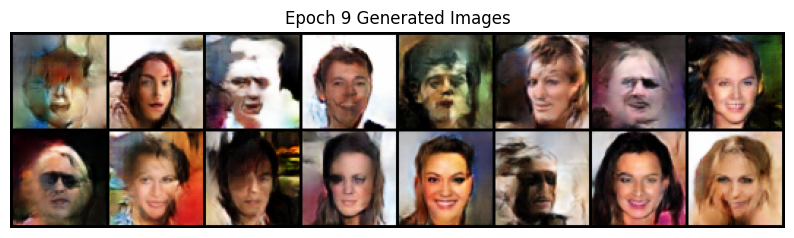

In [59]:
# Training Loop
for epoch in range(num_epochs):
    g_losses = []
    d_losses = []
    
    with tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # Train Discriminator (n_critic times per Generator step)
            for _ in range(n_critic):
                optimizer_D.zero_grad()

                real_outputs = discriminator(real_images)
                fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
                fake_outputs = discriminator(fake_images.detach())

                d_loss = -torch.mean(real_outputs) + torch.mean(fake_outputs)  # Wasserstein loss
                d_loss.backward()
                optimizer_D.step()

                # Apply weight clipping
                for p in discriminator.parameters():
                    p.data.clamp_(-weight_clip, weight_clip)

            # Train Generator
            optimizer_G.zero_grad()
            fake_outputs = discriminator(fake_images)
            g_loss = -torch.mean(fake_outputs)  # Generator loss
            g_loss.backward()
            optimizer_G.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

            # Update progress bar
            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))

    # Print loss every 10 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")

        # Save samples
        with torch.no_grad():
            z = torch.randn(16, nz, 1, 1).to(device)
            sample_images = generator(z)
            grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)
            plt.figure(figsize=(10, 10))
            plt.axis("off")
            plt.title(f"Epoch {epoch} Generated Images")
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.show()

# **Wasserstein GAN with Gradient Penalty (WGAN-GP)**

In [53]:
# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Loss and Optimizers
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=g_lr, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=d_lr, betas=(0.5, 0.999))

#Log loss
g_loss_log = []
d_loss_log = []

In [ ]:
# Training Loop with WGAN-GP
lambda_gp = 10  # Gradient penalty coefficient

for epoch in range(num_epochs):
    g_losses = []
    d_losses = []
    
    with tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
        for i, (real_images, _) in pbar:
            real_images = real_images.to(device)
            current_batch_size = real_images.size(0)

            # Train Discriminator (n_critic times per Generator step)
            for _ in range(n_critic):
                optimizer_D.zero_grad()

                real_outputs = discriminator(real_images)
                fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
                fake_outputs = discriminator(fake_images.detach())
                
                # Compute gradient penalty
                alpha = torch.rand(current_batch_size, 1, 1, 1, device=device)
                interpolates = (alpha * real_images + (1 - alpha) * fake_images).requires_grad_(True)
                d_interpolates = discriminator(interpolates)
                gradients = torch.autograd.grad(outputs=d_interpolates, inputs=interpolates,
                                                grad_outputs=torch.ones_like(d_interpolates),
                                                create_graph=True, retain_graph=True, only_inputs=True)[0]
                gradient_penalty = lambda_gp * ((gradients.view(gradients.size(0), -1).norm(2, dim=1) - 1) ** 2).mean()
                
                d_loss = -torch.mean(real_outputs) + torch.mean(fake_outputs) + gradient_penalty
                d_loss.backward()
                optimizer_D.step()

            # Train Generator
            optimizer_G.zero_grad()
            fake_images = generator(torch.randn(current_batch_size, nz, 1, 1).to(device))
            fake_outputs = discriminator(fake_images)
            g_loss = -torch.mean(fake_outputs)
            g_loss.backward()
            optimizer_G.step()

            g_losses.append(g_loss.item())
            d_losses.append(d_loss.item())

            # Update progress bar
            pbar.set_postfix(D_Loss=np.mean(d_losses), G_Loss=np.mean(g_losses))

    # Print loss every 10 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {np.mean(d_losses):.4f}, Loss G: {np.mean(g_losses):.4f}")

        # Save samples
        with torch.no_grad():
            z = torch.randn(16, nz, 1, 1).to(device)
            sample_images = generator(z)
            grid = vutils.make_grid(sample_images, normalize=True, scale_each=True)
            plt.figure(figsize=(10, 10))
            plt.axis("off")
            plt.title(f"Epoch {epoch} Generated Images")
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.show()
